In [1]:
from astroquery.skyview import SkyView
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u
import plotly.express as px
import numpy as np
from astropy.visualization import ZScaleInterval
import cv2
from scipy.signal import convolve2d

# Import meijering and sato filters from skimage
from skimage.filters import meijering, sato

# Import feature module from skimage
from skimage.feature import corner_foerstner

from skimage.feature import multiscale_basic_features


In [2]:
# Get the Andromeda data (M31) from SDSSg Survey using SkyView
hdu = SkyView.get_images("M31", "SDSSg")[0][0]

In [3]:
hdu

In [4]:
hdu.header

SIMPLE  =                    T / Written by SkyView Fri Mar 14 06:23:56 EDT 2025
BITPIX  =                  -32 / 4 byte floating point                          
NAXIS   =                    2 / Two dimensional image                          
NAXIS1  =                  300 / Width of image                                 
NAXIS2  =                  300 / Height of image                                
CRVAL1  =              10.6847 / Reference longitude                            
CRVAL2  =              41.2688 / Reference latitude                             
RADESYS = 'FK5     '           / Coordinate system                              
EQUINOX =               2000.0 / Epoch of the equinox                           
CTYPE1  = 'RA---TAN'           / Coordinates -- projection                      
CTYPE2  = 'DEC--TAN'           / Coordinates -- projection                      
CRPIX1  =                150.5 / X reference pixel                              
CRPIX2  =                150

In [5]:
M31_header = hdu.header
M31_Pixels = hdu.data

In [6]:
type(M31_Pixels)

numpy.ndarray

In [7]:
M31_Pixels.shape

(300, 300)

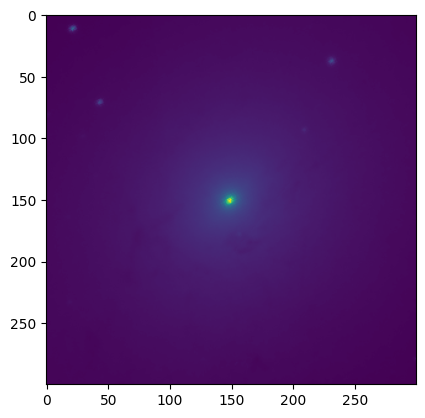

In [8]:
plt.imshow(M31_Pixels)

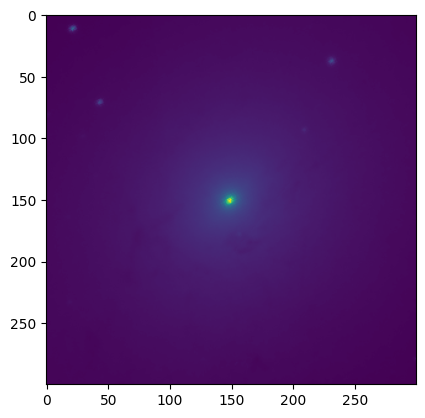

In [9]:
plt.imshow(M31_Pixels, cmap='viridis') # the default colormap is 'viridis'

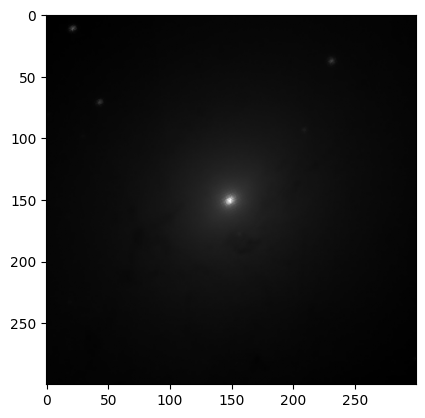

In [10]:
plt.imshow(M31_Pixels, cmap='gray')

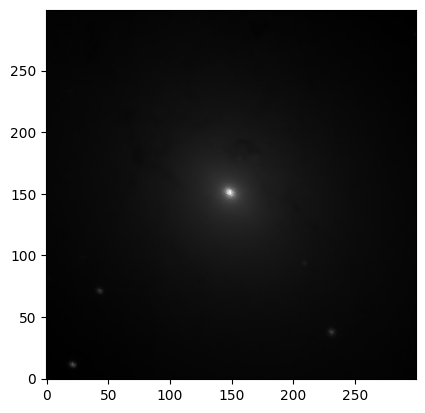

In [11]:
plt.imshow(M31_Pixels, cmap='gray', origin='lower') # origin='lower' flips the image (y-axis)

In [12]:
# Create the plot with flipped data
fig = px.imshow(M31_Pixels, color_continuous_scale='gray', origin='lower')
fig.show()

In [13]:
hdu = SkyView.get_images("M31", "DSS2 Blue", pixels=600, radius=60*u.arcmin)[0][0]

In [14]:
M31_DSS2_Blue_Pixels = hdu.data

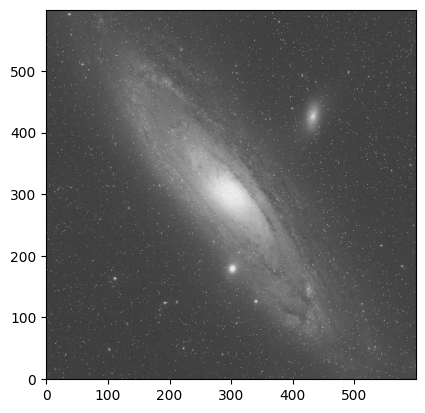

In [15]:
plt.imshow(M31_DSS2_Blue_Pixels, cmap='gray', origin='lower')

In [16]:
# Create the plot with flipped data
fig = px.imshow(M31_DSS2_Blue_Pixels, color_continuous_scale='gray', origin='lower')
fig.show()

## Pixel Scaling on M31 Data

In [17]:
# Printing the value of Pixel at the Center of Andromeda Galaxy
M31_Pixels[151, 151]

np.float32(126.5)

In [18]:
# Check some statistic (min, max, mean, std) of the data using numpy
print('Sumarray Statistics of M31 Pixels:-')
print(f'Minimum:- {np.min(M31_Pixels)}')
print(f'Maximum:- {np.max(M31_Pixels)}')
print(f'Average:- {np.mean(M31_Pixels)}')
print(f'Std:- {np.std(M31_Pixels)}')

Sumarray Statistics of M31 Pixels:-
Minimum:- 5.359375
Maximum:- 178.0
Average:- 13.329444885253906
Std:- 6.3922271728515625


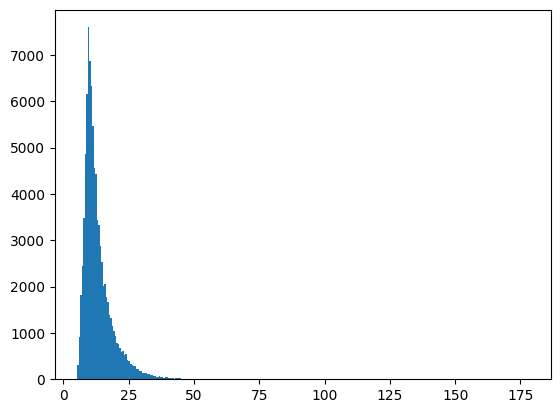

In [19]:
# Get the histogram distribution
plt.hist(M31_Pixels.flat, bins=300)
plt.show()

### 1) Intensity Normalization Or Linear Scaling Or Min Max Scaling

<img src='https://playfairdata.com/wp-content/uploads/2022/05/6.-minmax-calc.png' width=25%>

In [20]:
# A Common Function that will be used to plot the scaled pixel arrays
def plot_pixels(pixel_array, title, color):
  plt.imshow(pixel_array, cmap='gray', origin='lower')
  plt.title(title, color=color, weight='bold')
  plt.axis('off')

In [21]:
def compare_pixels(scaled_array, title):
  plt.subplot(1, 2, 1)
  plot_pixels(M31_Pixels, title='Original Image', color='black')
  plt.subplot(1, 2, 2)
  plot_pixels(scaled_array, title=title, color='royalblue')
  plt.tight_layout()
  plt.show()

In [22]:
# Define a function to normalize
def minmax_scaling(pixel_array):
  num = pixel_array - np.min(pixel_array)
  den = np.max(pixel_array) - np.min(pixel_array)
  return num/den

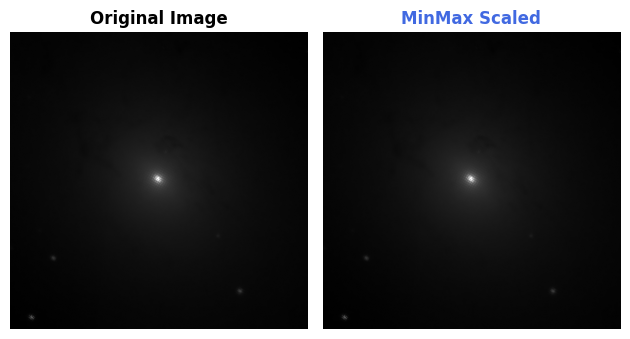

In [23]:
# Normalize the M31 data and visualize it
minmax_array = minmax_scaling(M31_Pixels)
compare_pixels(minmax_array, title='MinMax Scaled')

## Standardization Or Z scaling

<img src='https://tse2.mm.bing.net/th?id=OIP.aU-q_bfzwe1ObWyaU3CReQAAAA&pid=Api&P=0&h=180' width=15%>

In [24]:
# A function to standardize
def zscale(pixel_array):
  num = pixel_array - np.mean(pixel_array)
  den = np.std(pixel_array)
  return num/den

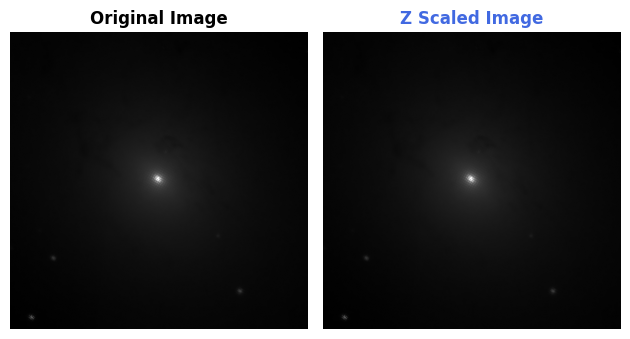

In [25]:
# Visualize the stardidize M31 data
zscaled_array = zscale(M31_Pixels)
compare_pixels(zscaled_array, title='Z Scaled Image')


## Log Normalization

In [26]:
# Log Normalization is simply the log of pixels! Create a function for the same!
def log_normalization(pixel_array):
  return np.log(pixel_array)

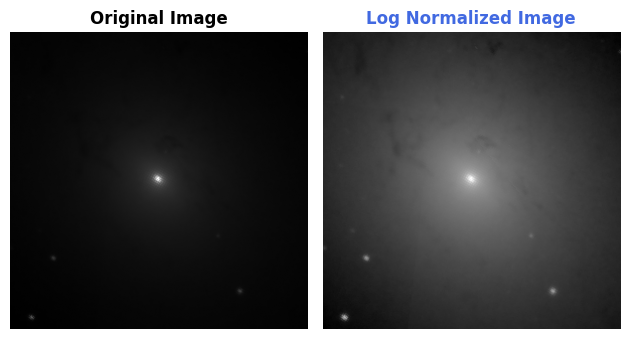

In [27]:
# Visualize the log normalization on M31 data
log_norm_array = log_normalization(M31_Pixels)
compare_pixels(log_norm_array, title='Log Normalized Image')

## Create a Histogram Distribution of Pixels of the best output so far

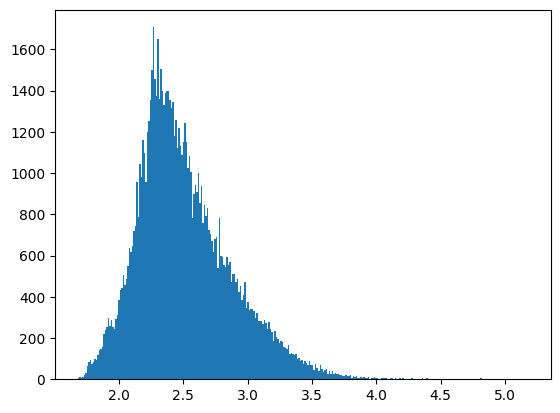

In [28]:
# Let's proceed with this log normalization!
plt.hist(log_norm_array.flat, bins=300)
plt.show()

## Square Root

In [29]:
def sqrt_scaling(pixel_array):
  return np.sqrt(pixel_array)

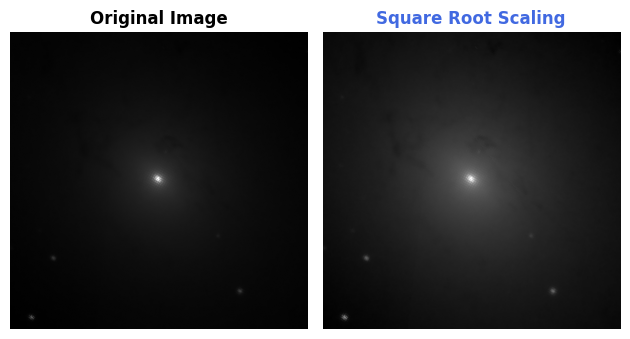

In [30]:
sqrt_array = sqrt_scaling(M31_Pixels)
compare_pixels(sqrt_array, title='Square Root Scaling')

## astropy.visualization Modules

### ZScaleInterval

In [31]:
# Create the object for ZScaleInterval
z = ZScaleInterval()

In [32]:
# Get min and max values of the M31 data
z1, z2 = z.get_limits(log_norm_array)

In [33]:
# Check z1 and z2 (min and max values based on the get_limits method; however, this is not equal to actual min and max values of the array)
print(f'Minimum = {z1}')
print(f'Maximum = {z2}')

Minimum = 1.6889997720718384
Maximum = 4.447910199027215


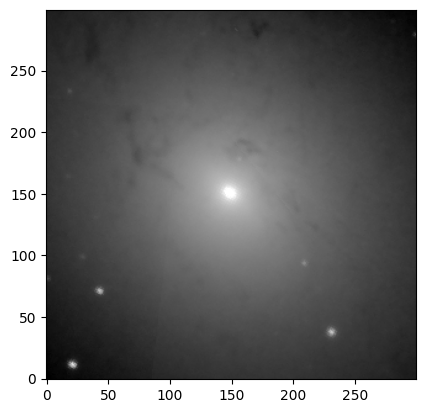

In [34]:
# Plot the M31 data using this interval
img = plt.imshow(log_norm_array, vmin=z1, vmax=z2, cmap='gray', origin='lower')
plt.show()

In [35]:
# Get the array created from the above cell
image_array = img.make_image(renderer=None, unsampled=True)[0]

In [36]:
# shape - check the channels
image_array.shape
# Red, Green, Blue and Alpha channels makes up a 4 channel image

(300, 300, 4)

### Change 4 channel image to grayscale

In [37]:
# Convert 4 channel image to grayscale image
gray_array = cv2.cvtColor(image_array, cv2.COLOR_BGRA2GRAY)

In [38]:
# Check if channels are set to 3 or 4 now
gray_array.shape

(300, 300)

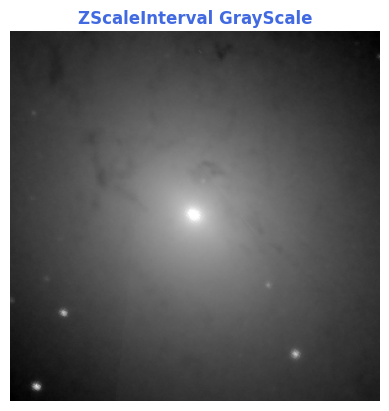

In [39]:
# Visualize it
plot_pixels(gray_array, title='ZScaleInterval GrayScale', color='royalblue')

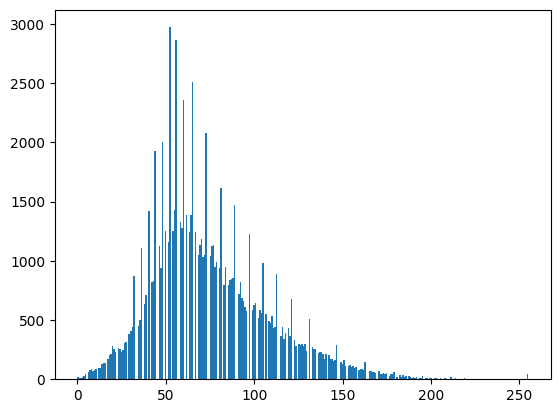

In [40]:
# Histogram Visualization
plt.hist(gray_array.flat, bins=300)
plt.show()

In [41]:
# Store grayscale in a new variable (will be using it later)
grayscale_zint_array = gray_array

## Denoising using Gaussian

It is technically Blurring the image by removing noises...Which is prerequisite to many filters and this is known as Gaussian Smoothing.


**<u>Convolution</u>:-**       
<img src='https://miro.medium.com/max/1400/1*O06nY1U7zoP4vE5AZEnxKA.gif' width=50%>

In [42]:
# Generate your kernel/filter
kernel = np.ones((3,3))/9

In [43]:
# Let's see how it looks
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [44]:
# Create a gaussian kernel
gaussian_kernel = np.array([[1/16, 1/8, 1/16],
                            [1/8, 1/4, 1/8],
                            [1/16, 1/8, 1/16]])

In [45]:
# Get the convolution done using our kernel
convolved_image = convolve2d(M31_Pixels, kernel, mode='same')

In [46]:
# Convolution done using gaussian kernel
gaussian_convolved_image = convolve2d(M31_Pixels, gaussian_kernel, mode='same')


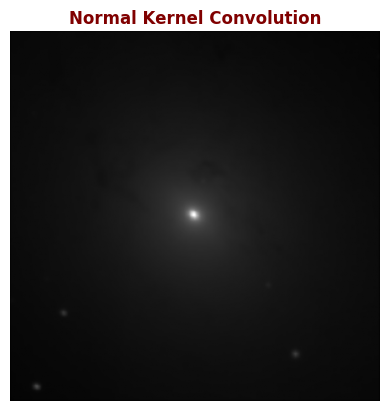

In [47]:
# Vizulaise the first kernel convolution
plot_pixels(convolved_image, title='Normal Kernel Convolution', color='maroon')


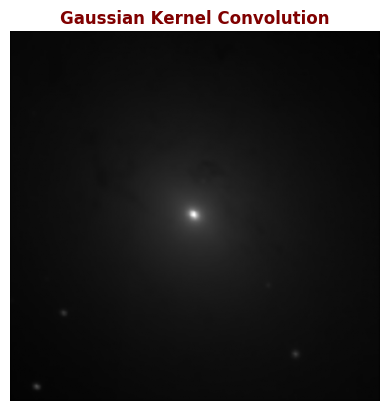

In [48]:
# Visualize the gausian kernel convolved output
plot_pixels(gaussian_convolved_image, title='Gaussian Kernel Convolution', color='maroon')

In [49]:
# Using grayscalel of M31 data to convolve with gaussian kernel
convolved_grayscale = convolve2d(grayscale_zint_array, gaussian_kernel, mode='same')

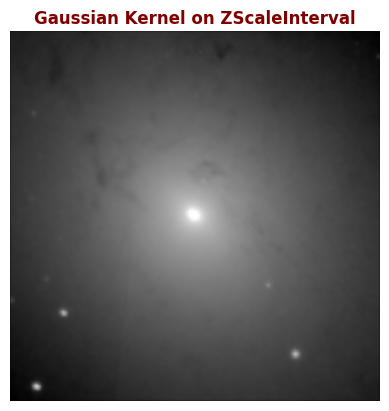

In [50]:
# Check how this looks now!
plot_pixels(convolved_grayscale, title='Gaussian Kernel on ZScaleInterval', color='maroon')

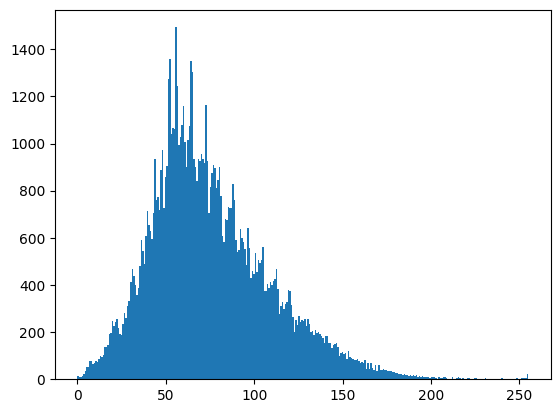

In [51]:
# Get the histogram
plt.hist(convolved_grayscale.flat, bins=300)
plt.show()

## Enhancing the Linear Features on M31

Take a look onto different available filters in skimage:-
https://scikit-image.org/docs/stable/api/skimage.filters.html

In [52]:
# Create spectral list to use later
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral"]

In [53]:
# Implement these filters on the convolved image
meijering_output = meijering(convolved_grayscale)
sato_output = sato(convolved_grayscale)

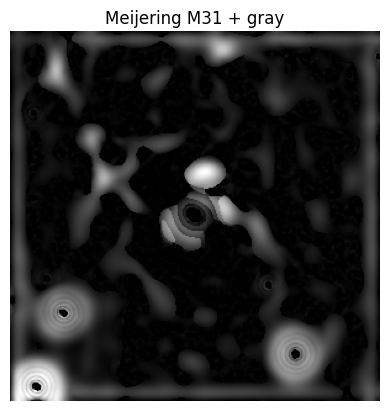

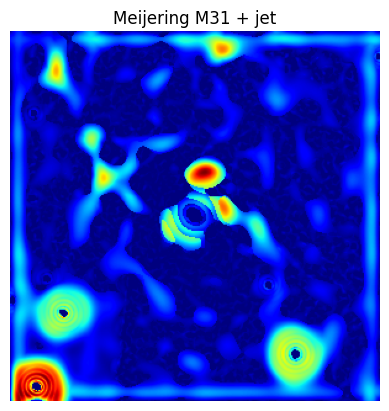

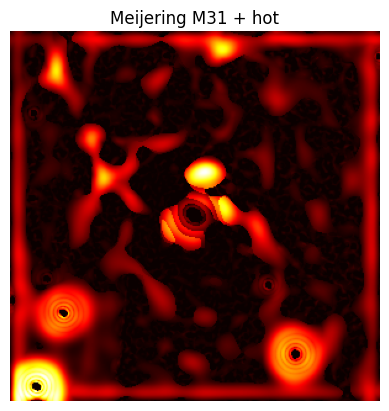

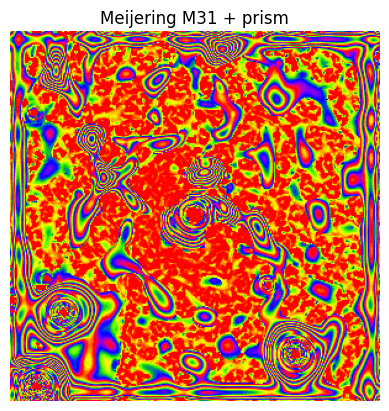

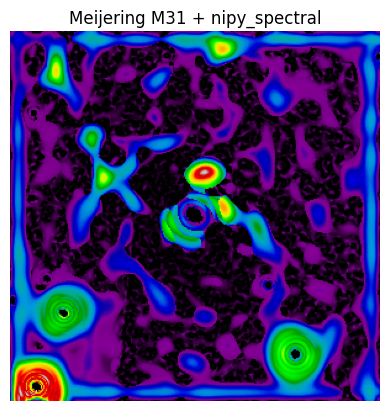

In [54]:
# For each element in the spectral list visulize the output for the meijering filter
for colormap in SPECTRAL_LIST:
  plt.imshow(meijering_output, cmap=colormap, origin='lower')
  plt.title(f'Meijering M31 + {colormap}')
  plt.axis('off')
  plt.show()

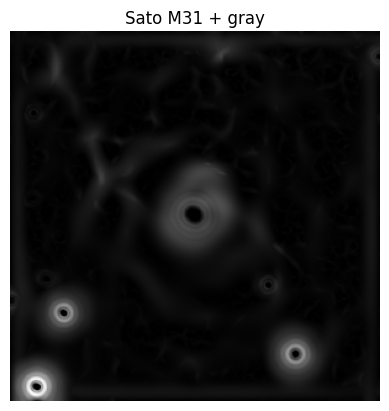

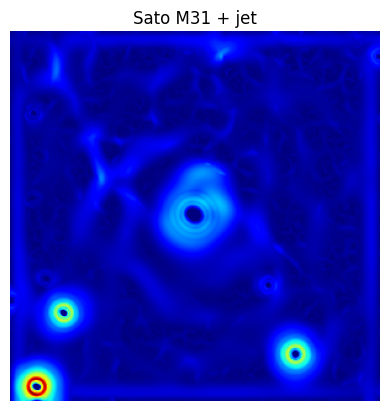

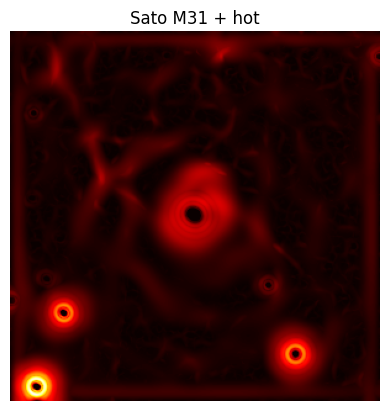

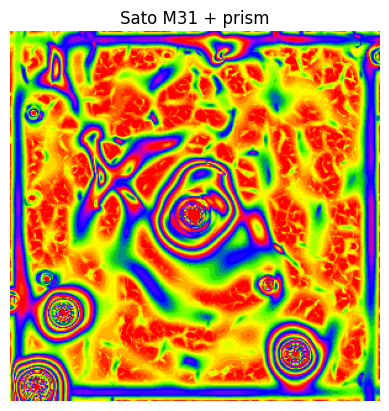

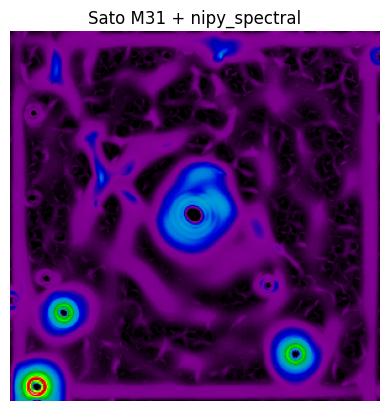

In [55]:
# For each element in the spectral list visulize the output for the sato filter
for colormap in SPECTRAL_LIST:
  plt.imshow(sato_output, cmap=colormap, origin='lower')
  plt.title(f'Sato M31 + {colormap}')
  plt.axis('off')
  plt.show()


## Feature Detection and Extraction

skimage different features:- https://scikit-image.org/docs/stable/api/skimage.feature.html

Skimage Feature used for Feature detection and extraction, e.g., texture analysis corners, etc.

In [56]:
# log_scaled pixels or standard scale pixes or Normalized pixels
feature_output = corner_foerstner(convolved_grayscale)

In [57]:
# Check the output of the featured image
feature_output[1]

array([[0.4989641 , 0.21946652, 0.20260812, ..., 0.24883013, 0.65938198,
        0.71467819],
       [0.39800763, 0.23215066, 0.14497339, ..., 0.54766745, 0.90813068,
        0.66235114],
       [0.24457695, 0.17733225, 0.10416085, ..., 0.98735337, 0.55825765,
        0.25356002],
       ...,
       [0.22429728, 0.51726484, 0.96709646, ..., 0.6867379 , 0.62290977,
        0.29146722],
       [0.64334682, 0.9009524 , 0.55832027, ..., 0.49465811, 0.75665701,
        0.5648419 ],
       [0.71794373, 0.66759447, 0.2532344 , ..., 0.24465286, 0.53700323,
        0.60483135]], shape=(300, 300))

In [58]:
# Type of the featured image
type(feature_output)

tuple

In [59]:
# Check the length of the tuple
len(feature_output)

2

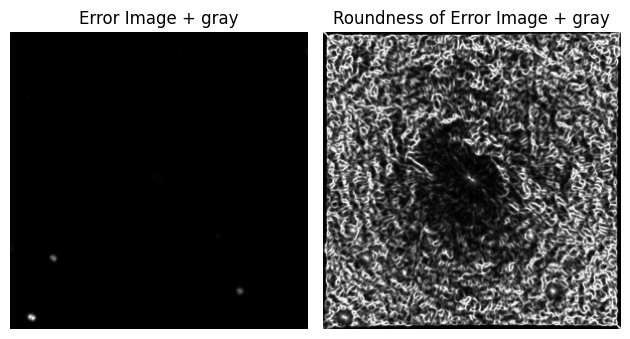

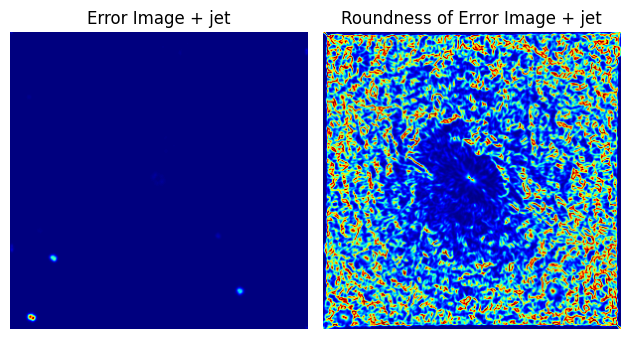

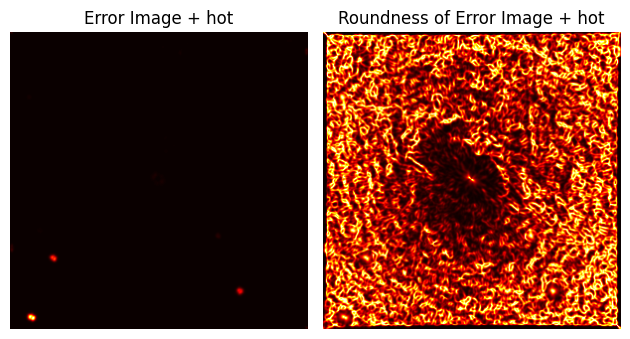

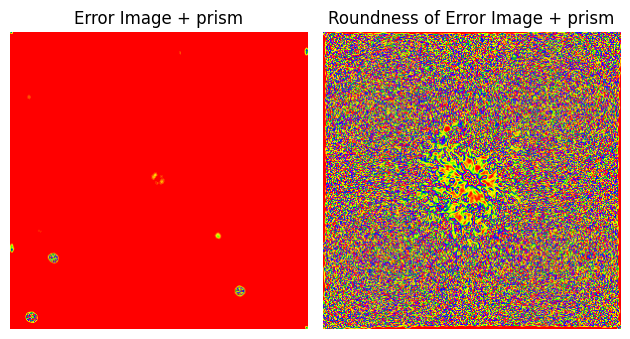

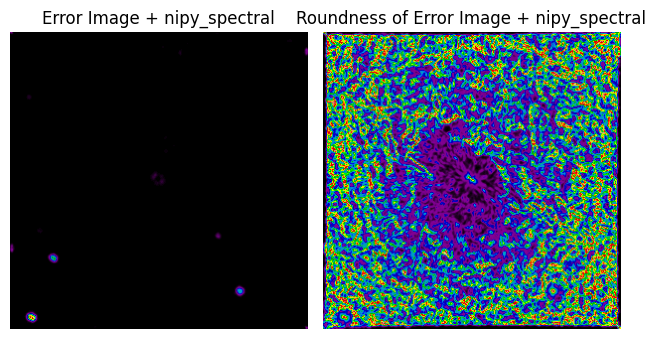

In [60]:
# Subplot Visualization
for colormap in SPECTRAL_LIST:
  plt.subplot(1, 2, 1)
  plt.imshow(feature_output[0], cmap=colormap, origin='lower')
  plt.title(f'Error Image + {colormap}')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(feature_output[1], cmap=colormap, origin='lower')
  plt.title(f'Roundness of Error Image + {colormap}')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

## multiscale_basic_features (Local Features)

In [61]:
# Generate again a new featured image
featured_image = multiscale_basic_features(convolved_grayscale)

In [62]:
# Get type
type(featured_image)

numpy.ndarray

In [63]:
# Shape
featured_image.shape

(300, 300, 24)

In [64]:
# Storing each and every channel from P1 to P24
P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24 = cv2.split(featured_image)

In [65]:
# Check P1
P1.shape

(300, 300)

In [66]:
# Create list of these pixels for each channel
Pixels = [P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24]

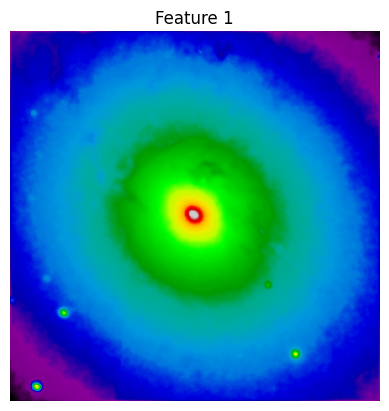

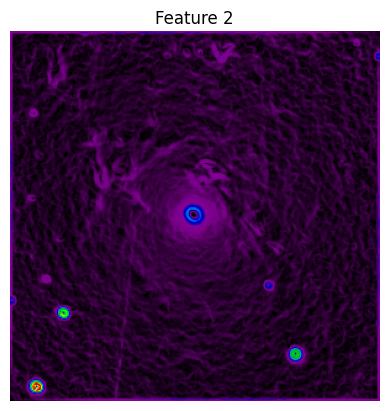

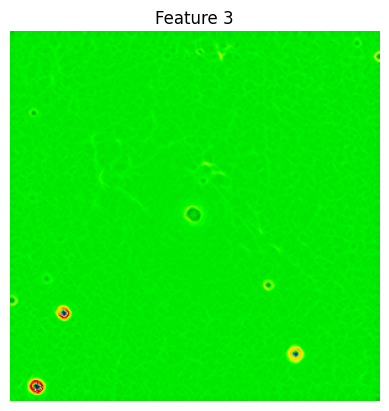

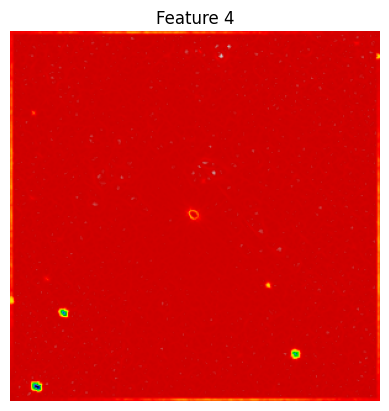

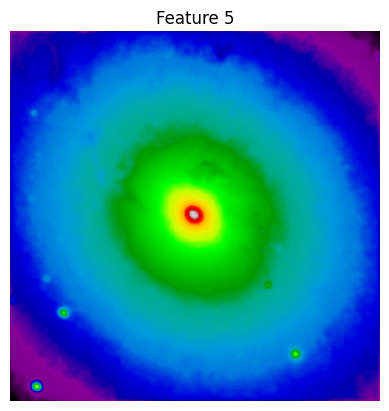

...

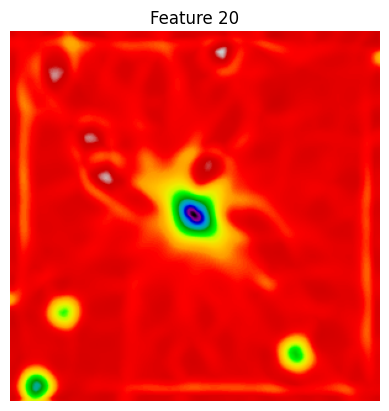

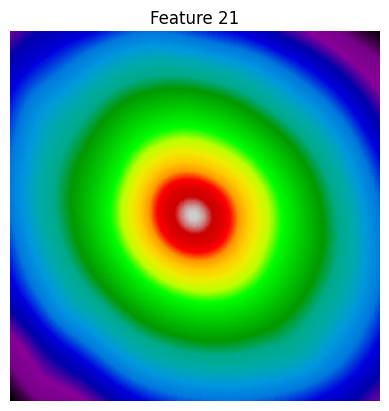

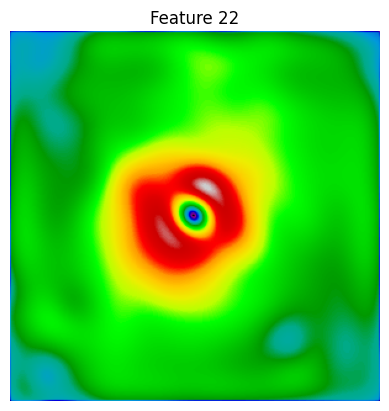

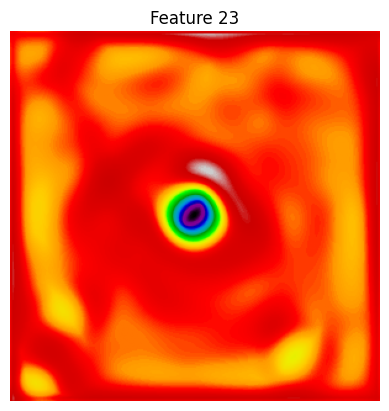

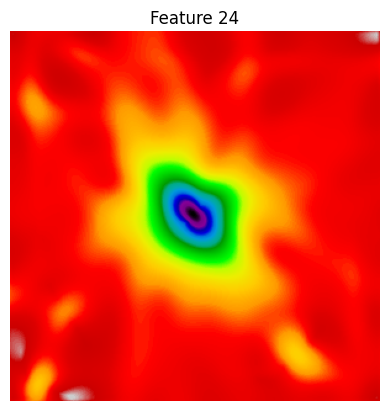

In [67]:
# Visualize each channel using prism spectral
for i, feature in enumerate(Pixels):
  plt.imshow(feature, cmap='nipy_spectral', origin='lower')
  plt.title(f'Feature {i+1}')
  plt.axis('off')
  plt.show()